In [17]:
!pip3 install tesseract-ocr

  Using cached tesseract-ocr-0.0.1.tar.gz (33 kB)
  Preparing metadata (setup.py) ... - \ done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      running bdist_wheel
      running build
      running build_py
      file tesseract_ocr.py (for module tesseract_ocr) not found
      file tesseract_ocr.py (for module tesseract_ocr) not found
      running build_ext
      building 'tesseract_ocr' extension
      creating build
      creating build/temp.macosx-10.9-x86_64-3.7
      gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -fno-common -dynamic -DNDEBUG -g -fwrapv -O3 -Wall -arch x86_64 -g -I/Library/Frameworks/Python.framework/Versions/3.7/include/python3.7m -c tesseract_ocr.cpp -o build/temp.macosx-10.9-x86_64-3.7/tesseract_ocr.o
      tesseract_ocr.cpp:779:10: fatal error: 'leptonica/allheaders.h' file not found
      #include "leptonica/allheaders.h"
               ^~~~~~~~~

In [7]:
from transformers import AutoTokenizer, LayoutLMModel
import torch
from PIL import Image
import pytesseract
import numpy as np


In [5]:
tokenizer = AutoTokenizer.from_pretrained("microsoft/layoutlm-base-uncased")
model = LayoutLMModel.from_pretrained("microsoft/layoutlm-base-uncased")

Downloading:   0%|          | 0.00/170 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/606 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/453M [00:00<?, ?B/s]

Some weights of the model checkpoint at microsoft/layoutlm-base-uncased were not used when initializing LayoutLMModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing LayoutLMModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing LayoutLMModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


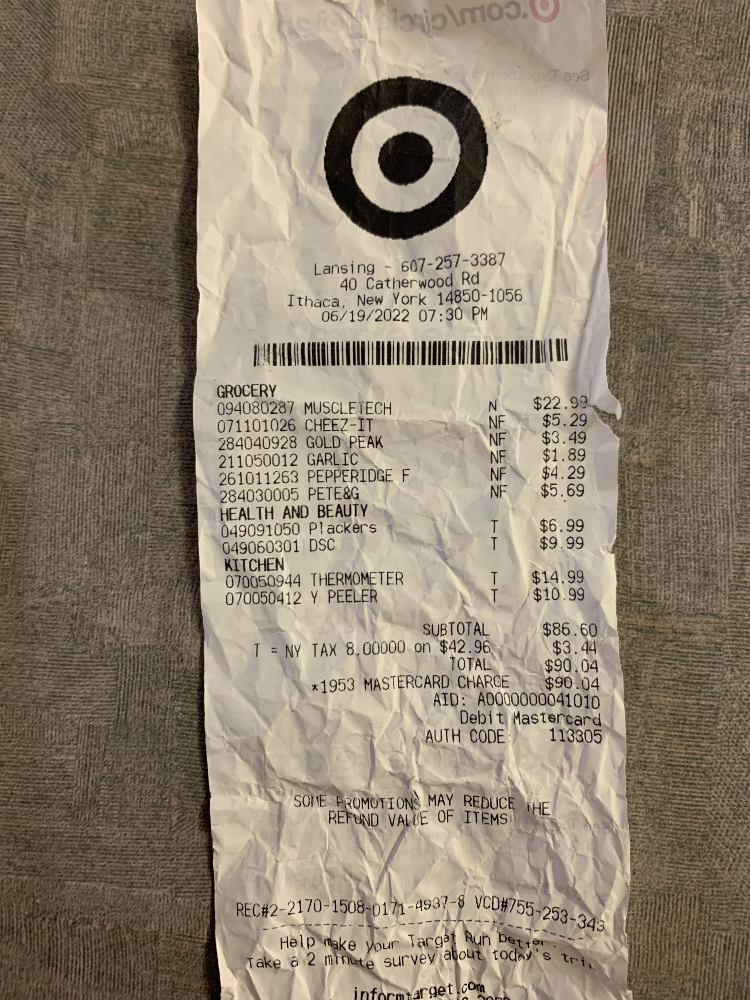

In [3]:
# Document can be a png, jpg, etc. PDFs must be converted to images.
image = Image.open('receipt.png').convert("RGB")

width, height = image.size
image

In [13]:
width, height = image.size
w_scale = 1000/width
h_scale = 1000/height

ocr_df = pytesseract.image_to_data(image, output_type='data.frame') \
            
ocr_df = ocr_df.dropna() \
               .assign(left_scaled = ocr_df.left*w_scale,
                       width_scaled = ocr_df.width*w_scale,
                       top_scaled = ocr_df.top*h_scale,
                       height_scaled = ocr_df.height*h_scale,
                       right_scaled = lambda x: x.left_scaled + x.width_scaled,
                       bottom_scaled = lambda x: x.top_scaled + x.height_scaled)

float_cols = ocr_df.select_dtypes('float').columns
ocr_df[float_cols] = ocr_df[float_cols].round(0).astype(int)
ocr_df = ocr_df.replace(r'^\s*$', np.nan, regex=True)
ocr_df = ocr_df.dropna().reset_index(drop=True)
ocr_df[:20]

TesseractNotFoundError: tesseract is not installed or it's not in your PATH. See README file for more information.